# E-field polarization class demo

For general handling of electric field polarization states, there are various methods implemented in the `EfieldPol()` class.

Main functionality:

- Creation of E-fields in [Cartesian $(E_x,E_y)$ and Spherical $(E_l,E_r)$ bases](#Define-fields).
- Conversion between basis types (in some cases).
- Field rotations. (See the [PADs section below for a brief example](#PADs-with-canonical-and-rotated-polarization-geometries), and the [frame definitions docs](../special_topics/frame_definitions_090324-tidy) for more details.)
- Field [plotting from spherical expansions](#Plotting-El,rE_{l,r}-spherical-expansions-with-native-routines).
- Pipe [E-field terms to PAD calculations](#Quick-demo-for-N2-case) via `self.setep()` and `self.calcEPR()` methods.

Additional functionality is also available via the [py_pol library](https://py-pol.readthedocs.io) if installed:

- Creation of fields [from elliptical field definitions](#Elliptical-basis) `(amp,az,ell)`.
- [Stokes vectors](#Stokes-representation-with-py_pol) and additional basis conversion routines.
- [Polarization state plotting](#Plotting-with-py_pol).

For more details see the [py_pol docs](https://py-pol.readthedocs.io), and install with `pip install py_pol`. Note that other `py_pol` routines are not wrapped in the class, but can be accessed via the `self.stokes` object. See the [py_pol Stokes class docs for further details](https://py-pol.readthedocs.io/en/master/source/tutorial/Stokes.html), including additional [generation routines](https://py-pol.readthedocs.io/en/master/source/tutorial/Stokes.html#Generating-polarization-states).

## Setup

For basic use, simply import the `EfieldPol` class.

In [1]:
from epsproc.efield.epol import EfieldPol

OMP: Info #276: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.


* sparse not found, sparse matrix forms not available. 
* natsort not found, some sorting functions not available. 


* Setting plotter defaults with epsproc.basicPlotters.setPlotters(). Run directly to modify, or change options in local env.


* Set Holoviews with bokeh.
* pyevtk not found, VTK export not available. 


## Define fields

### Basic case: $(E_x,E_y)$ and $(E_l,E_r)$

In [2]:
# Define as (Ex,Ey)
Exy = EfieldPol(Exy=[1,0])

Set field from Exy.
[[1. 0.]]


In [3]:
# Complex components are supported
# Note field is also normalized, pass normFlag=False to avoid this.
Exy_comp = EfieldPol(Exy=[1,1j])

Set field from Exy.
[[0.70710678+0.j         0.        +0.70710678j]]


In [4]:
# Magnitude, phase form is also supported
# This assumes terms [Ex,phix,Ey,phiy]
# And fields will be set as [Ex*e^{i*phix}, Ey*e^{i*phiy}]
Exy_mp = EfieldPol(Exy=[1,0,1,1j])

Set field from Exy.
[[0.9385079 +0.j 0.34525776+0.j]]


In [5]:
# Multiple fields can be defined
Exy_mult = EfieldPol(Exy=[[1,0],[1,1],[0.5,0.5*0.3j]])

Set field from Exy.
[[1.        +0.j         0.        +0.j        ]
 [0.70710678+0.j         0.70710678+0.j        ]
 [0.95782629+0.j         0.        +0.28734789j]]


For $E_{x,y}$ fields, the spherical basis representation $E_{l,r}$ is also assigned, using:

$E_l = E_x-iE_y$

$E_r = E_x+iE_y$

In [6]:
# Elr representation is assigned to the class object
print("Exy")
print(Exy_mp.Exy)

print("Elr")
print(Exy_mp.Elr)

Exy
[[0.9385079 +0.j 0.34525776+0.j]]
Elr
[[0.6636253-0.2441341j 0.6636253+0.2441341j]]


Fields can also be set directly in the $E_{l,r}$ basis in a similar manner:

In [7]:
# Elr functionality is similar
Elr = EfieldPol(Elr=[1,0])
Elr_comp = EfieldPol(Elr=[1,1j])
Elr_mp = EfieldPol(Elr=[1,0,1,1j])

Set field from Elr.
[[1 0]]
Set field from Elr.
[[1.+0.j 0.+1.j]]
Set field from Elr.
[[1.        +0.j 0.36787944+0.j]]


In [8]:
print("Elr")
print(Elr.Elr)

print("For the Elr specified case, Exy is also set if the py_pol library is present.")
print(Elr.Exy)

Elr
[[1 0]]
For the Elr specified case, Exy is also set if the py_pol library is present.
[[ 7.07106781e-01+0.j         -1.29893408e-16-0.70710678j]]


### Elliptical basis

If the [py_pol library](https://py-pol.readthedocs.io) is installed, fields can also be created using the `general_azimuth_ellipticity` routine, which accepts parameters `[amplitude,azimuth (0,pi), ellipticity (-pi/4,pi/4)]`.

In [9]:
import numpy as np

# Define circ pol fields (max and min ellipticity)
Eell_RCP = EfieldPol(ell=[1,0,np.pi/4])
Eell_LCP = EfieldPol(ell=[1,0,-np.pi/4])

# Define arb ellipticity
Eell_mixed = EfieldPol(ell=[1,0,0.25*np.pi/4])
Eell_rotated = EfieldPol(ell=[1,np.pi/3,0.25*np.pi/4])

# Mulitple ellipticities and rotations
states = 7
angles = np.linspace(0, np.pi, states)
ellipticities = np.linspace(-np.pi/6,np.pi/6, states)
ell = np.c_[np.ones(states),angles,ellipticities]
Eell_multi = EfieldPol(ell=ell)

Set field from ell.
[[1.         0.         0.78539816]]
Set field from ell.
[[ 1.          0.         -0.78539816]]
Set field from ell.
[[1.         0.         0.19634954]]
Set field from ell.
[[1.         1.04719755 0.19634954]]
Set field from ell.
[[ 1.          0.         -0.52359878]
 [ 1.          0.52359878 -0.34906585]
 [ 1.          1.04719755 -0.17453293]
 [ 1.          1.57079633  0.        ]
 [ 1.          2.0943951   0.17453293]
 [ 1.          2.61799388  0.34906585]
 [ 1.          3.14159265  0.52359878]]


## Plotting $E_{l,r}$ spherical expansions with native routines

Plotting the $E_{l,r}$ basis as an expansion in spherical harmonics is implemented via a wrapper for :py:func:`epsproc.sphFromBLMPlot()`.

This is useful to confirm the polarization geometry relative to the canonical 3D reference frame, see [PADs section below for an example](#PADs-with-canonical-and-rotated-polarization-geometries).

Using complex betas (from BLMX array).
*** WARNING: plot dataset has min value < 0, min = (-0.47798384817472783-0.006104139430947618j). This may be unphysical and/or result in plotting issues.
Sph plots: 
Plotting with facetDims=None, pType=a with backend=mpl.


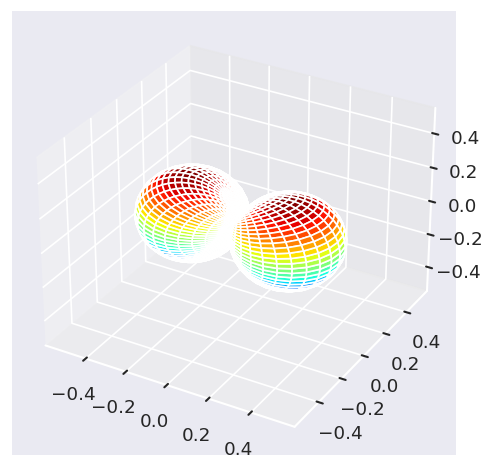

In [10]:
# Plot light fields
Eell_mixed.plotSph()

## Stokes representation with `py_pol`

If the `py_pol` library is installed, fields are also expressed as Stokes vectors, and associated functionality is available (see the [py_pol Stokes vector class docs](https://py-pol.readthedocs.io/en/master/source/tutorial/Stokes.html) for more details).


In [11]:
# The .stokes attribute contains the py_pol Stokes representation
print(type(Elr.stokes))
print(Elr.stokes)
print(Exy.stokes)
print(Exy_comp.stokes)

<class 'py_pol.stokes.Stokes'>
RCP source + LCP source = 
[+1.000]   
[+0.000]   
[+0.000]   
[-1.000]   

Light source from Exy = 
[+1.000]   
[+1.000]   
[+0.000]   
[-0.000]   

Light source from Exy = 
[+1.000]   
[+0.000]   
[-1.000]   
[+0.000]   



Note there may be some phase ambiguities in conversion to and from Stokes vectors, check the global phase for the associated (Ex,Ey) phase term if missing.

TODO: verify issues here.

In [12]:
print(Exy.stokes.global_phase)
print(Exy_comp.stokes.global_phase)

[0.]
[0.]


## Plotting with `py_pol`

If the `py_pol` library is installed, fields can be plotted (from their Stokes vectors). The main `stokes.draw_ellipse()` functionality is wrapped as `self.plot()`, and other functions can be accessed via `self.stokes.func()`. See the [py_pol plotting docs](https://py-pol.readthedocs.io/en/master/source/tutorial/Drawing_docs.html) for details.

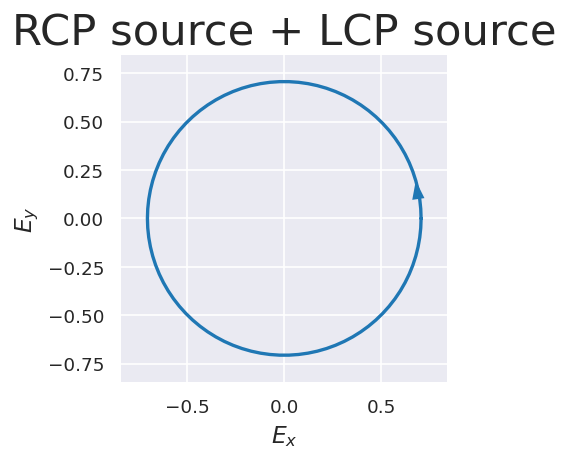

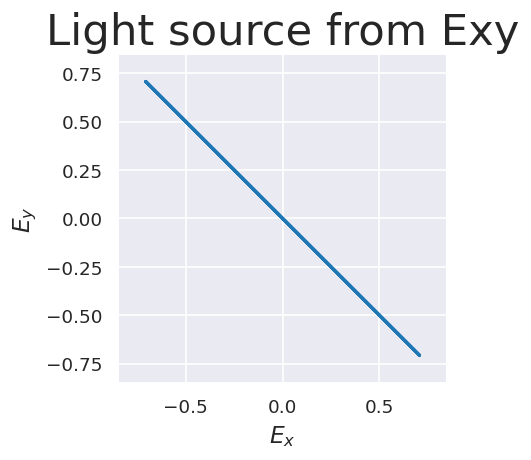

In [13]:
# Basic plotting is also available, and wrapped in self.plot()
# For more plotting options see https://py-pol.readthedocs.io/en/master/source/tutorial/Drawing_docs.html
Elr.plot(figsize=(4,4))
Exy_comp.plot(figsize=(4,4))

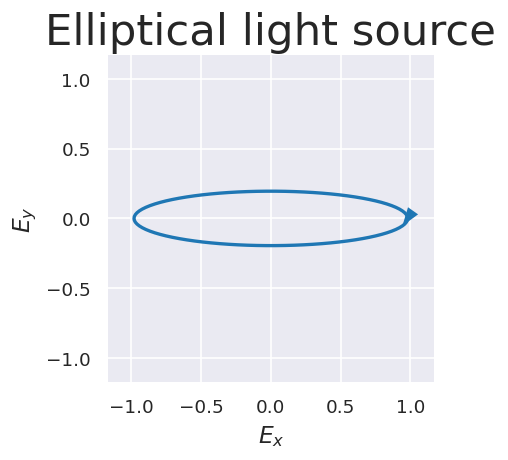

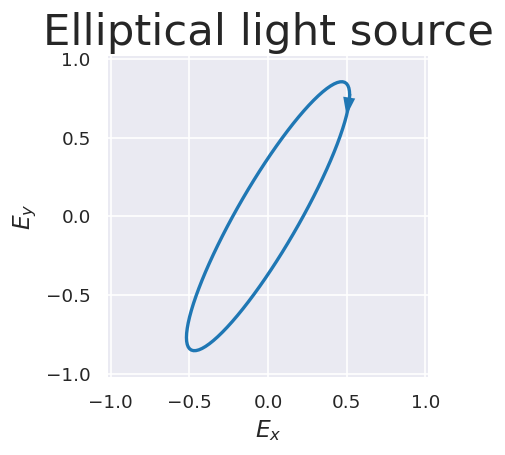

In [14]:
Eell_mixed.plot(figsize=(4,4))
Eell_rotated.plot(figsize=(4,4))

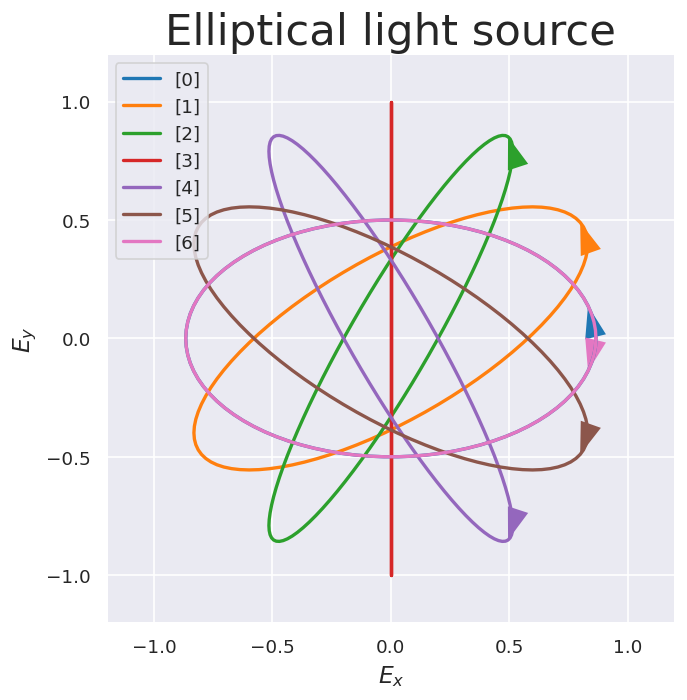

In [15]:
Eell_multi.plot()

In [16]:
# Note in some cases plotting may give issues with setting axes
# TODO: method to override this? Issue with some complex fields only?
# Exy_mult.plot(figsize=(4,4))

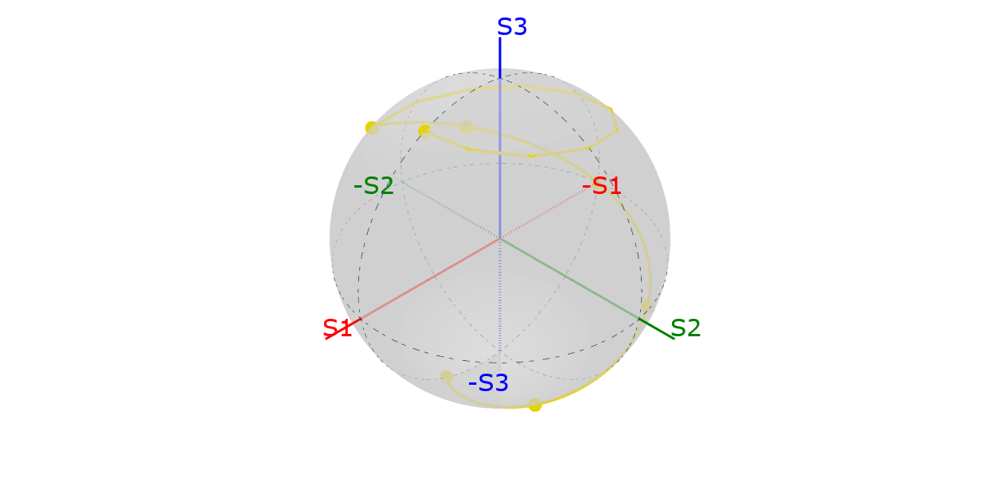

In [17]:
# Poincare sphere plots are also available from py_pol
# Note this requires Plotly, 
# see https://py-pol.readthedocs.io/en/master/source/tutorial/Drawing_docs.html#Poincar%C3%A9-sphere
Eell_multi.stokes.draw_poincare(kind="scatterline")

## Using polarized fields for PAD calculations

The EfieldPol functions are not currently integrated into the main `ePSproc` computational classes, but fields can be passed in $(El,Er)$ form. For more details on reference frames, see the [frame definitions docs (2024)](../special_topics/frame_definitions_docs_090324-tidy) for more details. MF calculations are currently always computed for rotations corresponding to canonical $(z,x,y)$ field axis alignment by default.

**NOTE: in development March 2024, some bugs may still be present.**

**TODO: EPR() currently only supports single field term, should update, and also allow for passing XR format directly.**



### Basic pipe

For quick conversion: 

- `self.setep()` will set a dictionary of terms that can be passed directly to PAD functions.
- `self.calcEPR()` will compute the corresponding EPR tensor term $E_{PR}(\hat{e})=[e\otimes e^*]^P_R$ (see [the Geometric Function dev notes](../methods/geometric_method_dev_260220_090420_tidy.html#E_{P,R}-tensor) for details).

In [18]:
print(Eell_LCP.Elr)
Eell_LCP.setep()

[[7.85046229e-17+9.18485099e-17j 1.00000000e+00-9.18485099e-17j]]
Set parameters to `self.epDict` and `self.epXR`.


In [19]:
# self.epDict contains (p,ep) field terms.
Eell_LCP.epDict

{'ep': array([ 7.85046229e-17+9.18485099e-17j, -1.00000000e+00+9.18485099e-17j]),
 'p': [-1, 1]}

In [20]:
# self.epXR contains (p,ep) field terms in Xarray form
Eell_LCP.epXR

<xarray.DataArray (Labels: 1, p: 2)>
array([[ 7.85046229e-17+9.18485099e-17j, -1.00000000e+00+9.18485099e-17j]])
Coordinates:
  * p        (p) int64 -1 1
  * Labels   (Labels) int64 1

In [21]:
# EPR tensor demo
Eell_LCP.calcEPR()

Set geomCalc.EPR() results to `self.EPRX`.


In [22]:
Eell_LCP.EPRX

<xarray.DataArray (QN: 8)>
array([-4.53246652e-17-5.30287619e-17j, -4.53246652e-17+5.30287619e-17j,
        5.55111512e-17+6.49467042e-17j, -5.55111512e-17+6.49467042e-17j,
        1.45991246e-32+0.00000000e+00j, -3.20493781e-17-3.74969972e-17j,
       -3.20493781e-17+3.74969972e-17j,  1.00000000e+00+0.00000000e+00j])
Coordinates:
  * QN       (QN) MultiIndex
  - l        (QN) int64 1 1 1 1 1 1 1 1
  - lp       (QN) int64 1 1 1 1 1 1 1 1
  - P        (QN) int64 0 0 1 1 2 2 2 2
  - p        (QN) int64 -1 1 -1 1 -1 -1 1 1
  - R-p      (QN) int64 1 -1 1 -1 -1 1 -1 1
  - R        (QN) int64 0 0 0 0 -2 0 0 2
Attributes:
    dataType:   EPR
    phaseCons:  {'phaseConvention': 'S', 'genMatEcons': {'negm': False}, 'EPR...

Plotting data (No filename), pType=r, thres=None, with Seaborn
Plotting data (No filename), pType=phase, thres=None, with Seaborn


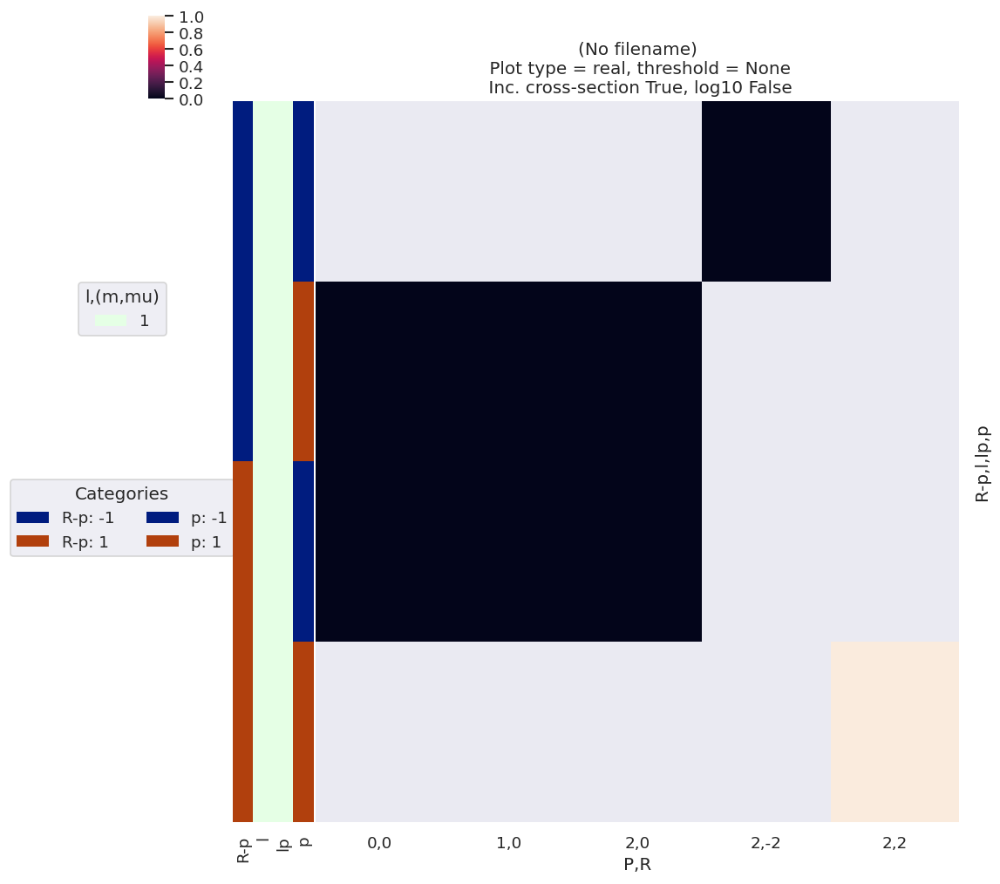

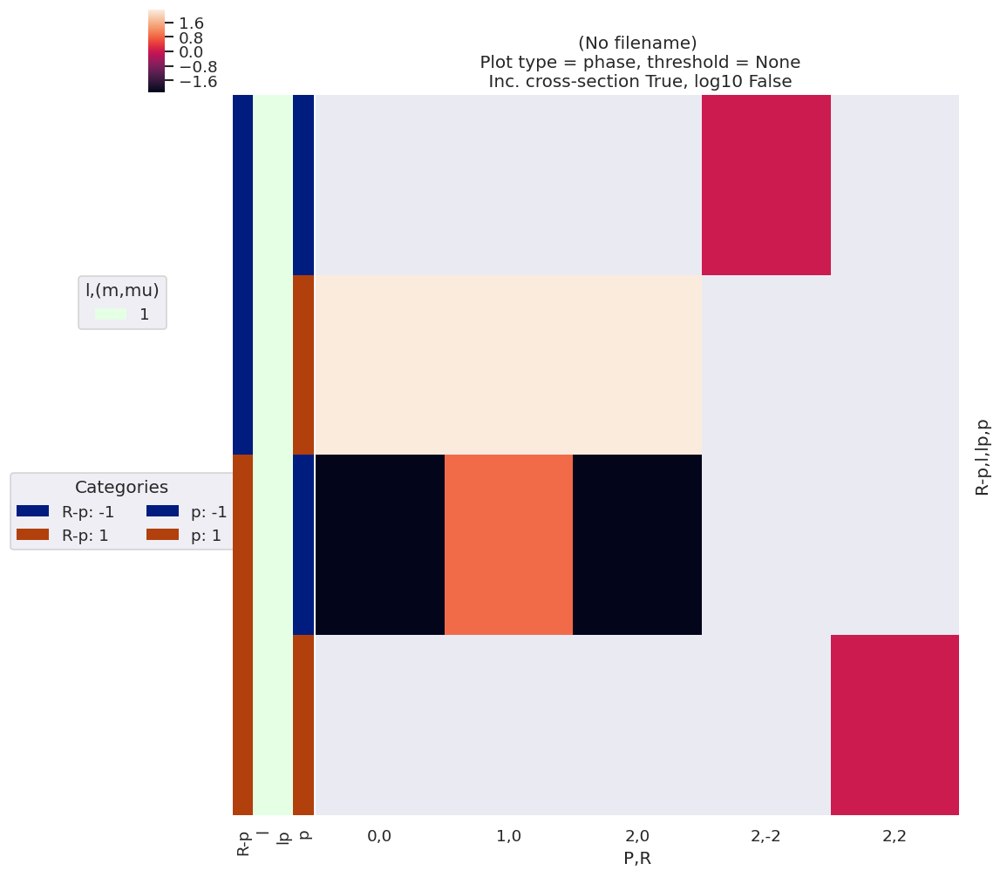

In [23]:
# Plot EPR with lmPlot
import epsproc as ep
daPlot, daPlotpd, legendList, gFig = ep.lmPlot(Eell_LCP.EPRX, xDim = {'PR':['P','R']}, pType = 'r', thres=None)
daPlot, daPlotpd, legendList, gFig = ep.lmPlot(Eell_LCP.EPRX, xDim = {'PR':['P','R']}, pType = 'phase', thres=None)

### Quick demo for N2 case

Following [the main class demo](../demos/ePSproc_class_demo_161020.html), here's a quick demonstration with piped-in E-field terms. 

(NOTE: Using demo template code from `ePSproc/notebooks/ePSdev_NB_template.ipynb`, see QM3 for updated routines.)

#### Import matrix elements

In [24]:
# Import
import epsproc as ep  
from pathlib import Path

# Set data path
# Note this is set here from ep.__path__, but may not be correct in all cases - depends on where the Github repo is.
epDemoDataPath = Path(ep.__path__[0]).parent/'data'
dataPath = epDemoDataPath/'photoionization'/'n2_multiorb'


In [25]:
# Class dev code
from epsproc.classes.multiJob import ePSmultiJob
from epsproc.classes.base import ePSbase

# Instantiate class object.
# Minimally this needs just the dataPath, if verbose = 1 is set then some useful output will also be printed.
data = ePSbase(dataPath, verbose = 1)

# ScanFiles() - this will look for data files on the path provided, and read from them.
data.scanFiles()


*** Job orb6 details
Key: orb6
Dir /home/jovyan/github/ePSproc/data/photoionization/n2_multiorb, 1 file(s).
{   'batch': 'ePS n2, batch n2_1pu_0.1-50.1eV, orbital A2',
    'event': ' N2 A-state (1piu-1)',
    'orbE': -17.09691397835426,
    'orbLabel': '1piu-1'}

*** Job orb5 details
Key: orb5
Dir /home/jovyan/github/ePSproc/data/photoionization/n2_multiorb, 1 file(s).
{   'batch': 'ePS n2, batch n2_3sg_0.1-50.1eV, orbital A2',
    'event': ' N2 X-state (3sg-1)',
    'orbE': -17.34181645456815,
    'orbLabel': '3sg-1'}


#### Compute MFPADs

In [26]:
# Use Epol class object as Einput, just needs self.epDict to be passed.
Einput = Eell_LCP
Einput.setep()

data.MFBLM(**Einput.epDict)

Set parameters to `self.epDict` and `self.epXR`.

Calculating MF-BLMs for job key: orb6

Calculating MF-BLMs for job key: orb5


In [27]:
data.BLMplot(dataType='MFBLM', thres = 1e-2, backend='hv', Erange=[0,15], ylim=(-1.5, 2.5), width=800)

BLMplot set data and plots to self.plots['BLMplot']


:HoloMap   [Labels,Orb]
   :NdOverlay   [l,m]
      :Curve   [Eke]   (BLM)

True

Note in this case that there are some issues potentially still to be resolved, in particular some $\beta_{LM}$ normalisation spikes in orb6 - this is a numerical issue due to small X-sections.

Using default sph betas.
Summing over dims: set()
Plotting from self.data[orb5][MFBLM], facetDims=['Eke', 'Labels'], pType=a with backend=pl.
*** WARNING: plot dataset has min value < 0, min = (-0.8726512841873089-0.14633808411546662j). This may be unphysical and/or result in plotting issues.


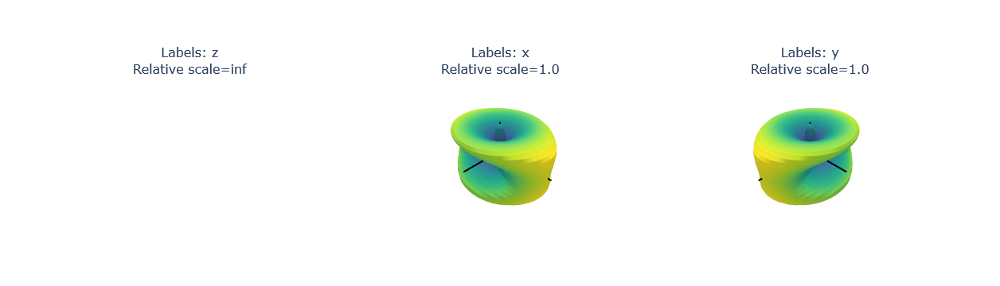

*** WARNING: plot dataset has min value < 0, min = (-0.5363131620056406-0.1010410646367611j). This may be unphysical and/or result in plotting issues.


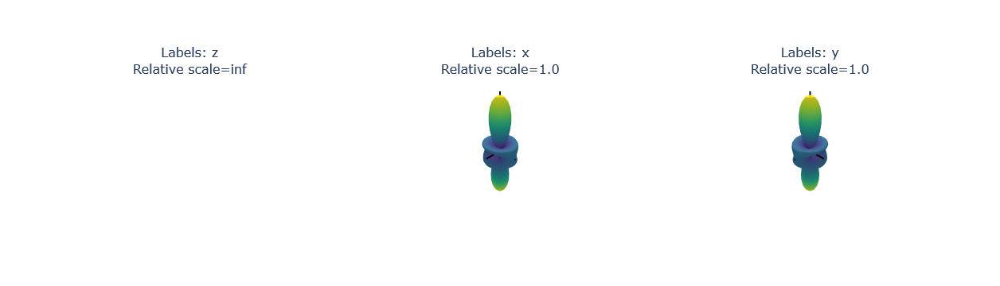

Set plot to self.data['orb5']['plots']['MFBLM']['polar']


In [28]:
data.padPlot(keys = 'orb5', Erange = [5, 10, 4], dataType='MFBLM', backend='pl', returnFlag=True)

Using default sph betas.
Summing over dims: set()
Plotting from self.data[orb6][MFBLM], facetDims=['Eke', 'Labels'], pType=a with backend=pl.
*** WARNING: plot dataset has min value < 0, min = (-2.4004497922385712-0.2135309198006078j). This may be unphysical and/or result in plotting issues.


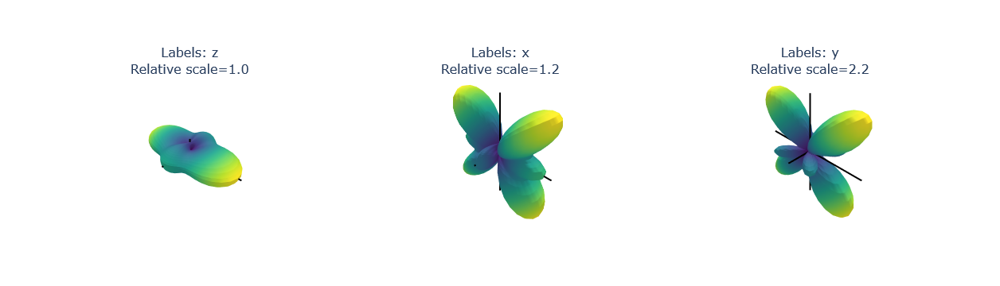

*** WARNING: plot dataset has min value < 0, min = (-6.835501957521992+0.05804009269499555j). This may be unphysical and/or result in plotting issues.


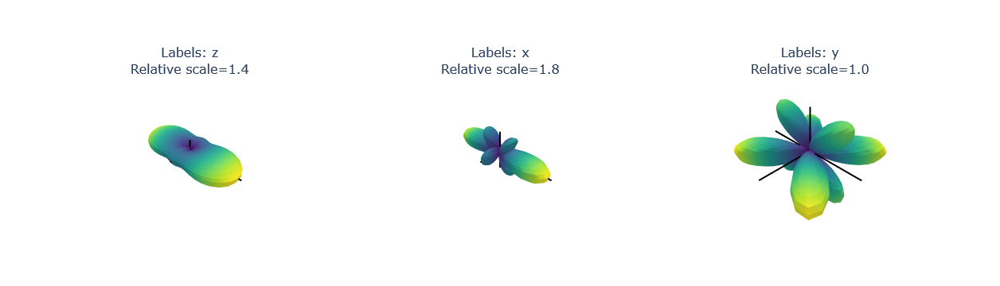

Set plot to self.data['orb6']['plots']['MFBLM']['polar']


In [29]:
data.padPlot(keys = 'orb6', Erange = [5, 10, 4], dataType='MFBLM', backend='pl', returnFlag=True)

## PADs with canonical and rotated polarization geometries

To convert from Epol/py_pol (x,y) definitions to usual definitions (z-pol for linear case), some additional frame transformations can be applied with `self.setOrientation()`, which wraps :py:func:`epsproc.sphCalc.setPolGeoms()` and :py:func:`epsproc.sphCalc.TKQarrayRotX()` for frame rotations.

- Mapping for linear cases usually sets the $z$-axis as the polarization axis, equivalent to transforming $x>z$ from the `Epol` class definitions.
- Mapping for circ pol cases usually sets the $z$-axis as the propagation axis, which is identical to the `Epol` class definitions.
- Other polarization geometries may be set by passing Euler angles - see the [frame definitions docs](../special_topics/frame_definitions_docs_090324) for more details.

Note that the default mappings are fixed by the reference frame assignment, so if the input field is already in a rotated frame the definitions here will still hold as a transformation of the rotated case.

In [30]:
# Use Epol class object as Einput, just needs self.epDict to be passed.
# Einput = Eell_rotated
Einput = Eell_mixed
Einput.setep()

# Set orientation in new frame

# Default case swaps Ex > Ez, appropriate for usual linear pol case.
# Note this is mapping = 'exy'
# Einput.setOrientation()

# Additional options can be set by passing mapping, or Euler angles directly
Einput.setOrientation(mapping = 'exyDiag')

# For circ pol, use mapping = 'circ'
# Einput.setOrientation(mapping = 'circ')

Set parameters to `self.epDict` and `self.epXR`.
Set pol state data to self.YLM and self.YLMrot, and orientations to self.RX.
Set orientations to self.epDict['RX'].


Using complex betas (from BLMX array).
*** WARNING: plot dataset has min value < 0, min = (-0.47798384817472783-0.006104139430947618j). This may be unphysical and/or result in plotting issues.
Sph plots: 
Plotting with facetDims=None, pType=a with backend=mpl.


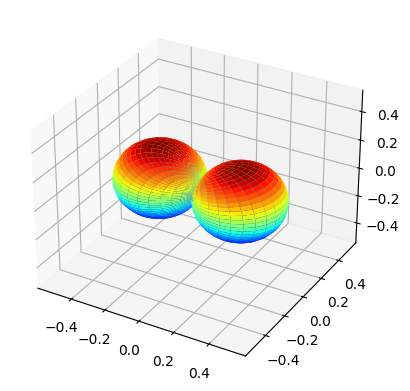

In [31]:
%matplotlib inline
# Note some build envs may need mpl inline reset here!

# Plot light fields - input
Einput.plotSph()

Using complex betas (from BLMX array).
*** WARNING: plot dataset has min value < 0, min = (-0.479214151642428+0j). This may be unphysical and/or result in plotting issues.
Sph plots: 
Plotting with facetDims=Euler, pType=a with backend=mpl.
Data dims: ('Euler', 'Phi', 'Theta'), subplots on Euler


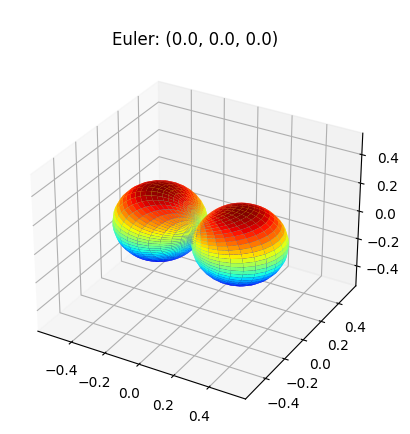

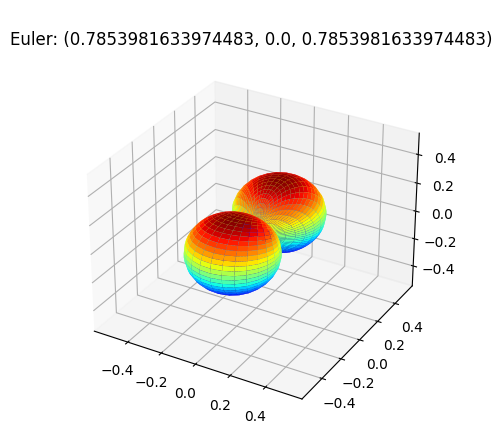

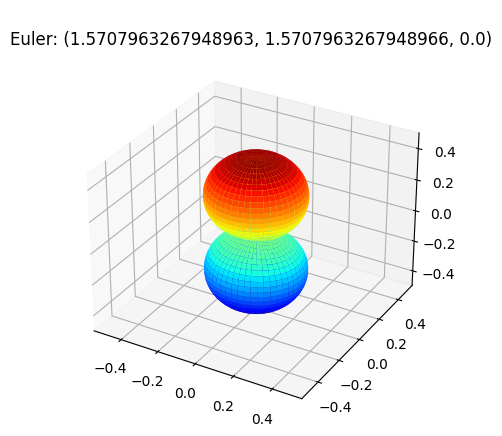

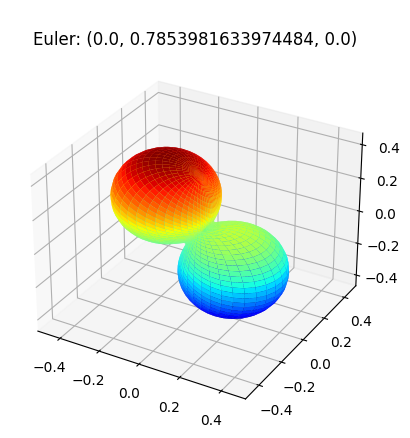

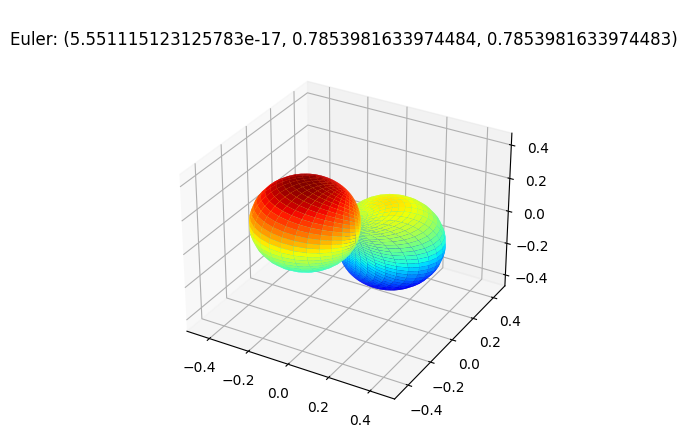

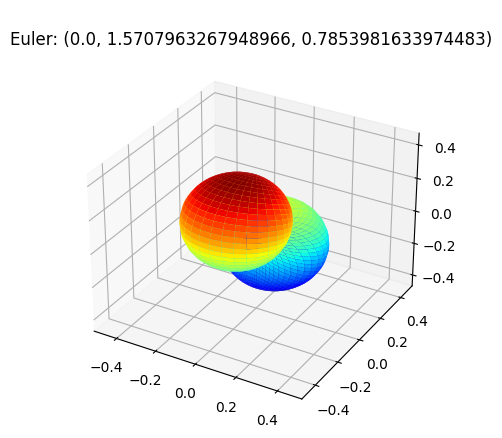

In [32]:
# Plot light fields - rotated frames
Einput.plotSph(dataType='rot')

In [33]:
Einput.epDict

{'ep': array([ 0.83146961-8.44698229e-18j, -0.55557023-8.44698229e-18j]),
 'p': [-1, 1],
 'RX': <xarray.DataArray (Euler: 6)>
 array([quaternion(1, -0, 0, 0),
        quaternion(0.707106781186548, -0, 0, 0.707106781186547),
        quaternion(0.5, -0.5, 0.5, 0.5),
        quaternion(0.923879532511287, -0, 0.38268343236509, 0),
        quaternion(0.853553390593274, 0.146446609406726, 0.353553390593274, 0.353553390593274),
        quaternion(0.653281482438188, 0.270598050073098, 0.653281482438188, 0.270598050073099)],
       dtype=quaternion)
 Coordinates:
   * Euler    (Euler) MultiIndex
   - P        (Euler) float64 0.0 1.571 1.571 0.0 0.0 0.0
   - T        (Euler) float64 0.0 0.0 1.571 0.7854 0.7854 1.571
   - C        (Euler) float64 0.0 0.0 0.0 0.0 0.7854 0.7854
     Labels   (Euler) <U32 'x' 'y' 'z' '+45x' '+45xy' '+45y'
 Attributes:
     dataType:  Euler}


Calculating MF-BLMs for job key: orb6

Calculating MF-BLMs for job key: orb5
Using default sph betas.
Summing over dims: set()
Plotting from self.data[orb5][MFBLM], facetDims=['Eke', 'Labels'], pType=a with backend=pl.
*** WARNING: plot dataset has min value < 0, min = (-0.06486796619804451-4.4785474129847395e-17j). This may be unphysical and/or result in plotting issues.


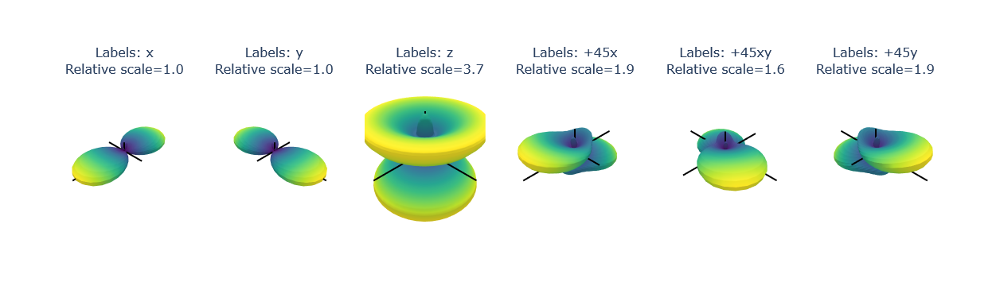

*** WARNING: plot dataset has min value < 0, min = (-0.055508950901505455-4.271033134036853e-17j). This may be unphysical and/or result in plotting issues.


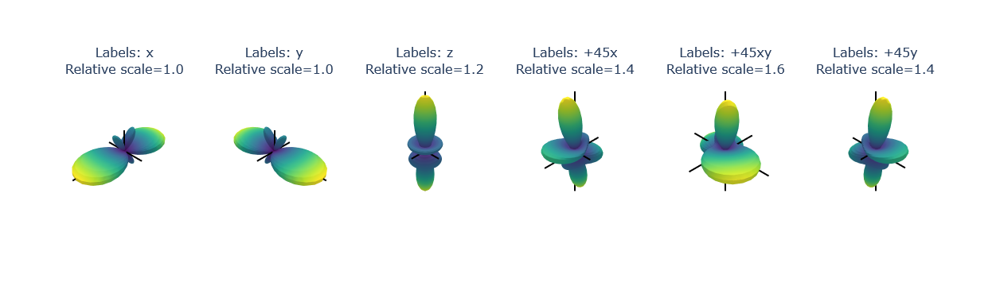

Set plot to self.data['orb5']['plots']['MFBLM']['polar']


In [34]:
# Compute MF with new frame rotation definitions
data.MFBLM(**Einput.epDict)

# Plot some MF results
data.padPlot(keys = 'orb5', Erange = [5, 10, 4], dataType='MFBLM', backend='pl', returnFlag=True)

## Versions

In [35]:
import scooby
scooby.Report(additional=['epsproc', 'holoviews', 'hvplot', 'xarray', 'matplotlib', 'bokeh', 'plotly'])

--------------------------------------------------------------------------------
  Date: Fri Mar 15 10:17:46 2024 EDT

                OS : Linux
            CPU(s) : 64
           Machine : x86_64
      Architecture : 64bit
               RAM : 62.8 GiB
       Environment : Jupyter
       File system : btrfs

  Python 3.10.11 | packaged by conda-forge | (main, May 10 2023, 18:58:44)
  [GCC 11.3.0]

           epsproc : 1.3.2-dev
         holoviews : 1.16.2
            hvplot : 0.8.4
            xarray : 2022.3.0
        matplotlib : 3.5.3
             bokeh : 3.1.1
            plotly : 5.15.0
             numpy : 1.23.5
             scipy : 1.10.1
           IPython : 8.13.2
            scooby : 0.7.2
--------------------------------------------------------------------------------

In [36]:
# Check current Git commit for local ePSproc version
from pathlib import Path
!git -C {Path(ep.__file__).parent} branch
!git -C {Path(ep.__file__).parent} log --format="%H" -n 1

* 3d-AFPAD-dev
0c68709cecb770648ff65e21ad3ae65b2699fb26


In [37]:
# Check current remote commits
!git ls-remote --heads https://github.com/phockett/ePSproc

0c68709cecb770648ff65e21ad3ae65b2699fb26	refs/heads/3d-AFPAD-dev
7e4270370d66df44c334675ac487c87d702408da	refs/heads/dev
1c0b8fd409648f07c85f4f20628b5ea7627e0c4e	refs/heads/master
69cd89ce5bc0ad6d465a4bd8df6fba15d3fd1aee	refs/heads/numba-tests
ea30878c842f09d525fbf39fa269fa2302a13b57	refs/heads/revert-9-master
baf0be0c962e8ab3c3df57c8f70f0e939f99cbd7	refs/heads/testDev
